In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
cd gdrive/MyDrive/Study/CS839/Graph\ from\ image/Results_relationship


/content/gdrive/MyDrive/Study/CS839/Graph from image/Results_relationship


In [ ]:
import json
import pandas as pd
import spacy
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner']) # just keep tagger for lemmatization


## Dataset creation from visual genome files

In [ ]:

file = open('relationships.json')

In [ ]:
relationships_json = json.load(file)

In [ ]:
type(relationships_json)

list

In [ ]:
len(relationships_json)

108077

In [ ]:
#relationships_json_reduced = relationships_json[0:20000]
relationships_json_reduced = relationships_json

In [ ]:
relationships_json_reduced

[{'image_id': 1,
  'relationships': [{'object': {'h': 290,
     'merged_object_ids': [5046],
     'names': ['sidewalk'],
     'object_id': 1058534,
     'synsets': ['sidewalk.n.01'],
     'w': 722,
     'x': 78,
     'y': 308},
    'predicate': 'ON',
    'relationship_id': 15927,
    'subject': {'h': 192,
     'name': 'shade',
     'object_id': 5045,
     'synsets': ['shade.n.01'],
     'w': 274,
     'x': 119,
     'y': 338},
    'synsets': ['along.r.01']},
   {'object': {'h': 28,
     'merged_object_ids': [5048],
     'names': ['shoes'],
     'object_id': 1058525,
     'synsets': ['shoe.n.01'],
     'w': 48,
     'x': 388,
     'y': 485},
    'predicate': 'wears',
    'relationship_id': 15928,
    'subject': {'h': 262,
     'name': 'man',
     'object_id': 1058529,
     'synsets': ['man.n.01'],
     'w': 60,
     'x': 238,
     'y': 249},
    'synsets': ['wear.v.01']},
   {'object': {'h': 15,
     'name': 'headlight',
     'object_id': 5050,
     'synsets': ['headlight.n.01'],
     '

In [ ]:
file.close()

In [ ]:
# image data to get image dimensions

file = open('image_data.json')
image_data_json = json.load(file)

In [ ]:
len(image_data_json)

108077

In [ ]:
image_data_json

[{'coco_id': None,
  'flickr_id': None,
  'height': 600,
  'image_id': 1,
  'url': 'https://cs.stanford.edu/people/rak248/VG_100K_2/1.jpg',
  'width': 800},
 {'coco_id': None,
  'flickr_id': None,
  'height': 600,
  'image_id': 2,
  'url': 'https://cs.stanford.edu/people/rak248/VG_100K/2.jpg',
  'width': 800},
 {'coco_id': None,
  'flickr_id': None,
  'height': 480,
  'image_id': 3,
  'url': 'https://cs.stanford.edu/people/rak248/VG_100K/3.jpg',
  'width': 640},
 {'coco_id': None,
  'flickr_id': None,
  'height': 480,
  'image_id': 4,
  'url': 'https://cs.stanford.edu/people/rak248/VG_100K/4.jpg',
  'width': 640},
 {'coco_id': None,
  'flickr_id': None,
  'height': 600,
  'image_id': 5,
  'url': 'https://cs.stanford.edu/people/rak248/VG_100K/5.jpg',
  'width': 800},
 {'coco_id': None,
  'flickr_id': None,
  'height': 600,
  'image_id': 6,
  'url': 'https://cs.stanford.edu/people/rak248/VG_100K/6.jpg',
  'width': 800},
 {'coco_id': None,
  'flickr_id': None,
  'height': 600,
  'image_id

In [ ]:
# NLP parser
def base_form(input_token):
  return " ".join([token.lemma_ for token in nlp(input_token.lower())])


In [ ]:
# Create a dataframe with combined data required for features and output

X = pd.DataFrame(columns = ['Image Height', 'Image_Width', 
                            'subject_name', 'subject_x', 'subject_y', 'subject_width', 'subject_height', 
                            'object_name', 'object_x', 'object_y', 'object_width', 'object_height'])
y = pd.DataFrame()

i = 0
for image_rel in relationships_json_reduced:
  #print(image_rel['image_id'])
  #image_width = image_data_json[image_rel['image_id'] - 1]['width']
  #image_height = image_data_json[image_rel['image_id'] - 1]['height']

  if(image_data_json[i]['image_id'] != image_rel['image_id']):
    print("Image IDs don't match", image_data_json[i]['image_id'], image_rel['image_id'])
    break

  image_width = image_data_json[i]['width']
  image_height = image_data_json[i]['height']

  for relationships_in_image in image_rel['relationships']:

    new_row = {'Image Height': image_height,
               'Image_Width': image_width,
               'subject_name': base_form(relationships_in_image['subject']['name'] if 'name' in relationships_in_image['subject'] else relationships_in_image['subject']['names'][0]),
               'subject_x': relationships_in_image['subject']['x'] + (relationships_in_image['subject']['w'] / 2),
               'subject_y': relationships_in_image['subject']['y'] + (relationships_in_image['subject']['h'] / 2), 
               'subject_width': relationships_in_image['subject']['w'],  
               'subject_height': relationships_in_image['subject']['h'], 
               'object_name': base_form(relationships_in_image['object']['name'] if 'name' in relationships_in_image['object'] else relationships_in_image['object']['names'][0]),
               'object_x': relationships_in_image['object']['x'] + (relationships_in_image['object']['w'] / 2),
               'object_y': relationships_in_image['object']['y'] + (relationships_in_image['object']['h'] / 2),
               'object_width': relationships_in_image['object']['w'],  
               'object_height': relationships_in_image['object']['h']
               
               }

    X = X.append(new_row, ignore_index=True)

    y = y.append({'relationship': base_form(relationships_in_image['predicate'])}, ignore_index=True)
  i += 1
  if(i % 5000 == 0):
    print(i)
    X.to_csv('X.csv')
    y.to_csv('y.csv')

5000
10000
15000


In [ ]:
X

,Image Height,Image_Width,subject_name,subject_x,subject_y,subject_width,subject_height,object_name,object_x,object_y,object_width,object_height
0,600,800,shade,256.0,434.0,274,192,sidewalk,439.0,453.0,722,290
1,600,800,man,268.0,380.0,60,262,shoe,412.0,499.0,48,28
2,600,800,car,516.0,364.0,74,98,headlight,525.5,373.5,23,15
3,600,800,sign,162.0,104.0,88,182,building,110.0,270.0,218,536
4,600,800,tree trunk,665.5,397.5,87,327,sidewalk,438.0,464.0,722,266
...,...,...,...,...,...,...,...,...,...,...,...,...
93724,232,314,bar,277.5,127.0,9,162,window,256.5,126.5,113,175
93725,232,314,bar,296.5,129.5,11,161,window,256.5,126.5,113,175
93726,232,314,bar,258.5,128.5,13,169,window,256.5,126.5,113,175
93727,232,314,bar,241.5,129.5,11,171,window,256.5,126.5,113,175


In [ ]:
y

,relationship
0,ON
1,wear
2,have
3,ON
4,ON
...,...
93724,ON
93725,ON
93726,ON
93727,ON


In [ ]:
X.to_csv('X.csv')
y.to_csv('y.csv')


In [ ]:
ls

image_data.json  relationships.json  X.csv  y.csv


In [ ]:
# Read X and y data
data = pd.read_csv('X.csv')
y = pd.read_csv('y.csv')
#y['relationship'] = y['relationship'].str.lower()
data['relationship'] = y.relationship

In [ ]:
data


,Unnamed: 0,Image Height,Image_Width,subject_name,subject_x,subject_y,subject_width,subject_height,object_name,object_x,object_y,object_width,object_height,relationship
0,0,600,800,shade,256.0,434.0,274,192,sidewalk,439.0,453.0,722,290,ON
1,1,600,800,man,268.0,380.0,60,262,shoe,412.0,499.0,48,28,wear
2,2,600,800,car,516.0,364.0,74,98,headlight,525.5,373.5,23,15,have
3,3,600,800,sign,162.0,104.0,88,182,building,110.0,270.0,218,536,ON
4,4,600,800,tree trunk,665.5,397.5,87,327,sidewalk,438.0,464.0,722,266,ON
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21161,21161,600,800,tile,409.0,429.0,68,42,floor,423.5,301.5,573,375,in
21162,21162,600,800,tile,599.0,415.0,116,136,floor,433.0,373.5,586,411,in
21163,21163,600,800,worker,259.0,301.5,38,45,vest,262.0,308.5,24,27,wear
21164,21164,600,800,sign,741.5,283.5,73,21,ceiling,401.5,103.0,795,194,hang from


In [ ]:
# Find unique 'objects' and 'predicates' in this data

unique_objects = X.subject_name.append(X.object_name)

NameError: ignored

In [ ]:
unique_objects

0             shade
1               man
2               car
3              sign
4        tree trunk
            ...    
21161         floor
21162         floor
21163          vest
21164       ceiling
21165          wall
Length: 42332, dtype: object

In [ ]:
len(unique_objects.unique())

2316

In [ ]:
unique_predicates = y.relationship.unique()

In [ ]:
len(unique_predicates)

893

In [ ]:
len(y['relationship'].value_counts() > 50 ==True)

ValueError: ignored

In [ ]:
# word embeddings
doc = nlp('on')
len(doc.vector)

96

In [ ]:
nlp_md = spacy.load('en_core_web_trf')
doc = nlp('on')
len(doc.vector)

OSError: ignored

In [ ]:
!python -m spacy download en_core_web_md

     |████████████████████████████████| 96.4 MB 1.3 MB/s 
  Created wheel for en-core-web-md: filename=en_core_web_md-2.2.5-py3-none-any.whl size=98051301 sha256=34e901ff9a7f9fcc925f4f22bc066c59b94962a47a5052c4cfb2e3d4395567d3
  Stored in directory: /tmp/pip-ephem-wheel-cache-7hy55nci/wheels/69/c5/b8/4f1c029d89238734311b3269762ab2ee325a42da2ce8edb997
Successfully built en-core-web-md
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_md')


In [ ]:
import spacy
from spacy.lang.en.examples import sentences 

nlp_md = spacy.load("en_core_web_md")
doc = nlp_md(sentences[0])
print(doc.text)
for token in doc:
    print(token.text, token.pos_, token.dep_)

Apple is looking at buying U.K. startup for $1 billion
Apple PROPN nsubj
is AUX aux
looking VERB ROOT
at ADP prep
buying VERB pcomp
U.K. PROPN compound
startup NOUN dobj
for ADP prep
$ SYM quantmod
1 NUM compound
billion NUM pobj


In [ ]:
doc = nlp('on')
len(doc.vector)

300

In [ ]:
# FOr now, lets go ahead with small model with 96-dimensional embeddings
doc = nlp('on')
len(doc.vector)

96

In [ ]:
min(doc.vector), max(doc.vector)

(-4.404537, 5.1215925)

In [ ]:
# Create new df with word embeddings

subject_name_df = pd.DataFrame()
for i in X.subject_name:
  d = pd.DataFrame(nlp(i).vector.reshape(1,-1))
  subject_name_df = subject_name_df.append(d)

subject_name_df = subject_name_df.add_prefix('subject_name_')

In [ ]:
# Create new df with word embeddings

object_name_df = pd.DataFrame()
for i in X.object_name:
  d = pd.DataFrame(nlp(i).vector.reshape(1,-1))
  object_name_df = object_name_df.append(d)

object_name_df = object_name_df.add_prefix('object_name_')


# Create new df with word embeddings

pre_name_df = pd.DataFrame()
for i in X.subject_name:
  d = pd.DataFrame(nlp(i).vector.reshape(1,-1))
  subject_name_df = subject_name_df.append(d)

subject_name_df = subject_name_df.add_prefix('subject_name_')

In [ ]:
y_new = y[y['relationship'].map(y['relationship'].value_counts()) > 50]

In [ ]:
y_new

,Unnamed: 0,relationship
0,0,on
1,1,wear
2,2,have
3,3,on
4,4,on
...,...,...
21159,21159,in
21160,21160,in
21161,21161,in
21162,21162,in


In [ ]:
len(y_new['relationship'].unique())

35

# Read

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [ ]:
cd gdrive/MyDrive/Study/CS839/Graph\ from\ image/Relationship/Results_relationship


/content/gdrive/MyDrive/Study/CS839/Graph from image/Relationship/Results_relationship


In [ ]:
pwd

'/content/gdrive/MyDrive/Study/CS839/Graph from image/Relationship/Results_relationship'

In [ ]:
import json
import pandas as pd
import spacy
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner']) # just keep tagger for lemmatization


In [ ]:
# Read X and y data
import pandas as pd

data = pd.read_csv('X.csv')
y = pd.read_csv('y.csv')
#y['relationship'] = y['relationship'].str.lower()
data['relationship'] = y.relationship

In [ ]:
len(data)

318918

In [ ]:
data = data[:50000]

In [ ]:
data

,Unnamed: 0,Image Height,Image_Width,subject_name,subject_x,subject_y,subject_width,subject_height,object_name,object_x,object_y,object_width,object_height,relationship
0,0,600,800,shade,256.0,434.0,274,192,sidewalk,439.0,453.0,722,290,on
1,1,600,800,man,268.0,380.0,60,262,shoe,412.0,499.0,48,28,wear
2,2,600,800,car,516.0,364.0,74,98,headlight,525.5,373.5,23,15,have
3,3,600,800,sign,162.0,104.0,88,182,building,110.0,270.0,218,536,on
4,4,600,800,tree trunk,665.5,397.5,87,327,sidewalk,438.0,464.0,722,266,on
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,49995,600,800,window,150.5,186.0,53,96,building,388.0,274.5,672,507,on
49996,49996,600,800,window,196.5,197.0,33,84,building,388.0,274.5,672,507,on
49997,49997,600,800,window,205.0,81.0,34,64,building,388.0,274.5,672,507,on
49998,49998,600,800,window,162.0,63.5,46,73,building,388.0,291.0,752,530,on


In [ ]:
# Check #unique values for 'objects' and 'relationships'

print('Before data cleaning: ')
print('#relationships = ', len(data['relationship'].unique()))

objects = data.subject_name.append(data.object_name)
print('#objects = ', len(objects.unique()))

Before data cleaning: 
#relationships =  1767
#objects =  4210


In [ ]:

# Remove rows which contain rarely occuring features
# relationship should occur at least 50 times
data = data[data['relationship'].map(data['relationship'].value_counts()) > 100]

# object should occur at least 50 times
data = data[data['subject_name'].map(data['subject_name'].value_counts()) > 100]

# object should occur at least 50 times
data = data[data['object_name'].map(data['object_name'].value_counts()) > 100]


In [ ]:
data

,Unnamed: 0,Image Height,Image_Width,subject_name,subject_x,subject_y,subject_width,subject_height,object_name,object_x,object_y,object_width,object_height,relationship
3,3,600,800,sign,162.0,104.0,88,182,building,110.0,270.0,218,536,on
5,5,600,800,man,268.0,380.0,60,262,shirt,270.5,339.5,59,101,have
12,12,600,800,man,268.0,380.0,60,262,shirt,270.5,339.5,59,101,have
13,13,600,800,man,268.0,380.0,60,262,pant,264.0,443.0,38,118,wear
14,14,600,800,man,409.5,389.5,75,251,jacket,400.5,344.5,89,97,have
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,49995,600,800,window,150.5,186.0,53,96,building,388.0,274.5,672,507,on
49996,49996,600,800,window,196.5,197.0,33,84,building,388.0,274.5,672,507,on
49997,49997,600,800,window,205.0,81.0,34,64,building,388.0,274.5,672,507,on
49998,49998,600,800,window,162.0,63.5,46,73,building,388.0,291.0,752,530,on


In [ ]:
# Check #unique values for 'objects' and 'relationships'

print('After data cleaning: ')
print('#relationships = ', len(data['relationship'].unique()))

objects = data.subject_name.append(data.object_name)
print('#objects = ', len(objects.unique()))

After data cleaning: 
#relationships =  43
#objects =  87


In [ ]:
# Data Preprocessing
X = pd.DataFrame()
X['rel_x'] = (data['subject_x'] - data['object_x'])/data['Image_Width']
X['rel_y'] = (data['subject_y'] - data['object_y'])/data['Image Height']
X['rel_w'] = data['subject_width']/data['object_width']
X['rel_h'] = data['subject_height']/data['object_height']
X['subject_name'] = data['subject_name']
X['object_name'] = data['object_name']

y = data['relationship']

In [ ]:
# Scaling width and height columns

minimum = X['rel_w'].min()
maximum =  X['rel_w'].max()

X['rel_w'] = (((X['rel_w'] - minimum) / (maximum - minimum)) * 2) - 1

minimum = X['rel_h'].min()
maximum =  X['rel_h'].max()

X['rel_h'] = (((X['rel_h'] - minimum) / (maximum - minimum)) * 2) - 1

In [ ]:
len(y.unique())

43

In [ ]:
#Replace similar predicates

synonyms = {
    'on': ['be on', 'on top of', 'over', 'on a' ],
    'in': ['in a', 'inside', 'inside of'],
    'of': ['of a'],
    'wear': ['wear a'],
    'have': ['have a']

}

for key in synonyms:
  for i in synonyms[key]:
    y = y.replace(i, key)


In [ ]:
len(y.unique())

33

## Encoding
Use one of these three

In [ ]:
# ONe-hot encoding, but separately on subject and object names
categorical_cols = ['subject_name', 'object_name']
X = pd.get_dummies(X, columns = categorical_cols)

In [ ]:
# Word embeddings using SpaCy sm language model
# Create new df with word embeddings

objects = data.subject_name.append(data.object_name)

object_name_df = pd.DataFrame()
for i in objects.unique():
  d = pd.DataFrame(nlp(i).vector.reshape(1,-1))
  object_name_df = object_name_df.append(d)

object_name_df = object_name_df.add_prefix('object_name_')


# Create new df with word embeddings

subject_name_df = pd.DataFrame()
for i in objects.unique():
  d = pd.DataFrame(nlp(i).vector.reshape(1,-1))
  subject_name_df = subject_name_df.append(d)


#Scalign

subject_name_df = subject_name_df.add_prefix('subject_name_')


object_name_df['object_name'] = X.object_name.unique()
subject_name_df['subject_name'] = X.subject_name.unique()


# Join the tables to get common word encodings

X = X.merge(subject_name_df, how = 'inner', on = 'subject_name')
X = X.merge(object_name_df, how = 'inner', on = 'object_name')

# delete cols

del X['subject_name']
del X['object_name']

In [ ]:
# Create new df with word embeddings scaled to [-1, 1]

objects = data.subject_name.append(data.object_name)

object_name_df = pd.DataFrame()
for i in objects.unique():
  d = pd.DataFrame(nlp(i).vector.reshape(1,-1))
  object_name_df = object_name_df.append(d)

object_name_df = object_name_df.add_prefix('object_name_')

minimum = object_name_df.min().min()
maximum = object_name_df.max().max()

object_name_df = (((object_name_df - minimum) / (maximum - minimum)) * 2) - 1


# Create new df with word embeddings

subject_name_df = pd.DataFrame()
for i in objects.unique():
  d = pd.DataFrame(nlp(i).vector.reshape(1,-1))
  subject_name_df = subject_name_df.append(d)

subject_name_df = subject_name_df.add_prefix('subject_name_')

minimum = subject_name_df.min().min()
maximum = subject_name_df.max().max()

subject_name_df = (((subject_name_df - minimum) / (maximum - minimum)) * 2) - 1


object_name_df['object_name'] = objects.unique()
subject_name_df['subject_name'] = objects.unique()


# Join the tables to get common word encodings

X = X.merge(subject_name_df, how = 'inner', on = 'subject_name')
X = X.merge(object_name_df, how = 'inner', on = 'object_name')

# delete cols

del X['subject_name']
del X['object_name']

In [ ]:
# COmmon one hot encodings
objects = data.subject_name.append(data.object_name)
print('#objects = ', len(objects.unique()))

Encoder = pd.DataFrame()
Encoder['sub'] = objects.unique()
#Encoder['ob'] = objects.unique()

Encoder = pd.get_dummies(Encoder)

Encoder['subject_name'] = objects.unique()
X = X.merge(Encoder, how = 'inner', on = 'subject_name')



Encoder = pd.DataFrame()
Encoder['ob'] = objects.unique()

Encoder = pd.get_dummies(Encoder)

Encoder['object_name'] = objects.unique()
X = X.merge(Encoder, how = 'inner', on = 'object_name')

# delete cols

del X['subject_name']
del X['object_name']

#objects =  87


In [ ]:
X

,rel_x,rel_y,rel_w,rel_h,subject_name_0,subject_name_1,subject_name_2,subject_name_3,subject_name_4,subject_name_5,...,object_name_86,object_name_87,object_name_88,object_name_89,object_name_90,object_name_91,object_name_92,object_name_93,object_name_94,object_name_95
0,0.065000,-0.276667,0.403670,0.339552,0.157186,-0.408004,-0.229470,-0.142462,0.339178,0.019541,...,-0.399536,-0.115338,-0.152950,-0.125666,0.214510,-0.356266,0.100176,0.014121,0.143038,-0.295142
1,-0.008125,-0.073333,0.477778,0.268817,0.157186,-0.408004,-0.229470,-0.142462,0.339178,0.019541,...,-0.399536,-0.115338,-0.152950,-0.125666,0.214510,-0.356266,0.100176,0.014121,0.143038,-0.295142
2,-0.020000,-0.067500,0.565217,0.755020,0.157186,-0.408004,-0.229470,-0.142462,0.339178,0.019541,...,-0.399536,-0.115338,-0.152950,-0.125666,0.214510,-0.356266,0.100176,0.014121,0.143038,-0.295142
3,-0.051250,0.167500,0.471264,0.133588,0.157186,-0.408004,-0.229470,-0.142462,0.339178,0.019541,...,-0.399536,-0.115338,-0.152950,-0.125666,0.214510,-0.356266,0.100176,0.014121,0.143038,-0.295142
4,0.149167,0.235000,0.193452,0.080139,0.157186,-0.408004,-0.229470,-0.142462,0.339178,0.019541,...,-0.399536,-0.115338,-0.152950,-0.125666,0.214510,-0.356266,0.100176,0.014121,0.143038,-0.295142
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17493,-0.007500,-0.040000,0.262136,0.292419,0.154672,-0.169145,0.149797,-0.131217,0.121006,0.028640,...,-0.137484,-0.159783,-0.175727,-0.111062,0.086226,-0.033512,-0.461865,0.362100,0.187230,-0.044996
17494,-0.123750,-0.056667,0.210356,0.241877,0.154672,-0.169145,0.149797,-0.131217,0.121006,0.028640,...,-0.137484,-0.159783,-0.175727,-0.111062,0.086226,-0.033512,-0.461865,0.362100,0.187230,-0.044996
17495,-0.026875,-0.061667,0.273438,0.190476,0.154672,-0.169145,0.149797,-0.131217,0.121006,0.028640,...,-0.137484,-0.159783,-0.175727,-0.111062,0.086226,-0.033512,-0.461865,0.362100,0.187230,-0.044996
17496,0.032500,-0.043333,0.250000,0.206349,0.154672,-0.169145,0.149797,-0.131217,0.121006,0.028640,...,-0.137484,-0.159783,-0.175727,-0.111062,0.086226,-0.033512,-0.461865,0.362100,0.187230,-0.044996


## SVM classifier

In [ ]:
# Import train_test_split function
from sklearn.model_selection import train_test_split

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=109) # 70% training and 30% test

In [ ]:
#Import svm model
from sklearn import svm

#Create a svm Classifier
clf = svm.SVC(kernel='linear') # Linear Kernel

#Train the model using the training sets
clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [ ]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Precision: ", precision_score(y_test, y_pred, average="macro"))
print("Recall: ",recall_score(y_test, y_pred, average="macro"))
print("F1 score: ",f1_score(y_test, y_pred, average="macro"))


Accuracy: 0.5771428571428572
Precision:  0.09946454757768591
Recall:  0.06419901097900141
F1 score:  0.06419769858948253


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


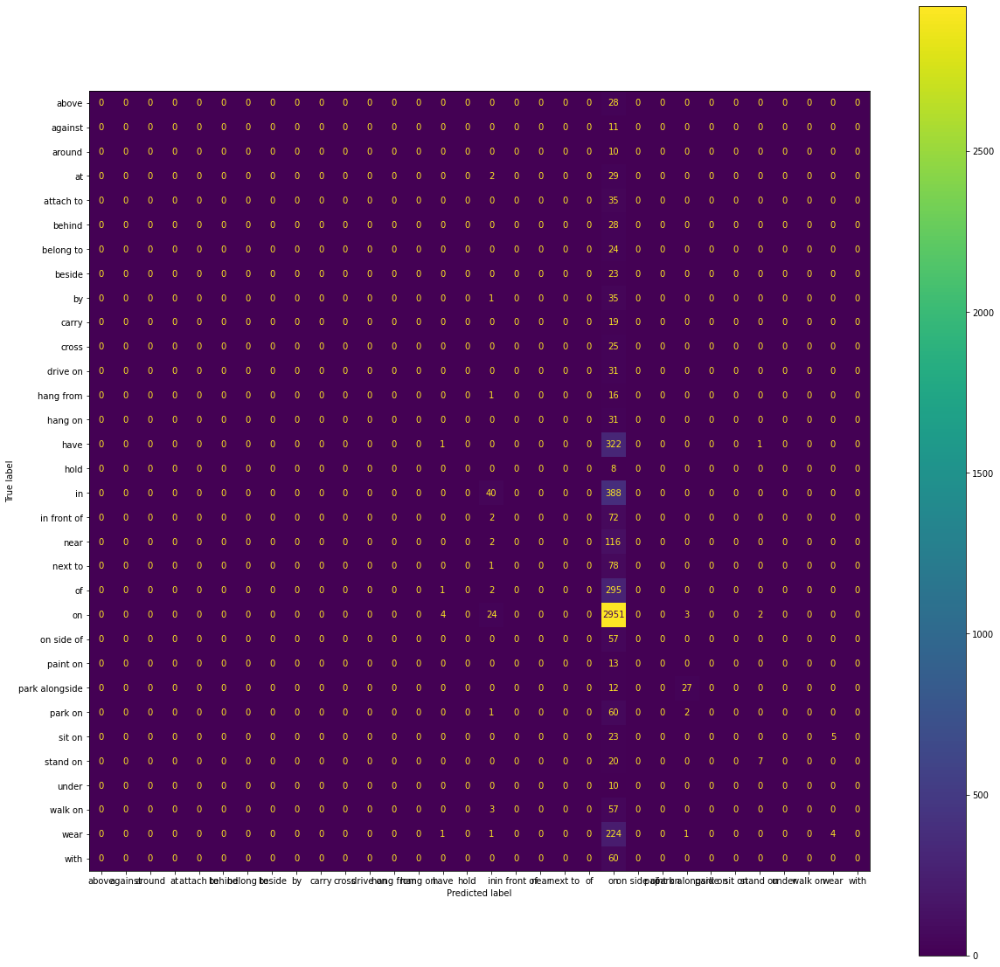

In [ ]:
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
%matplotlib inline
fig, ax = plt.subplots(figsize=(20, 20))
plot_confusion_matrix(clf, X_test, y_test, ax=ax)


In [ ]:
m.shape

(34, 34)

In [ ]:
df_cm = pd.DataFrame(m, index = y,
                  columns = y)
plt.figure(figsize = (10,7))
sn.heatmap(df_cm, annot=True)

ValueError: ignored

## Neural network for classification

In [ ]:
y

3          on
5        have
12       have
13       wear
14       have
         ... 
49995      on
49996      on
49997      on
49998      on
49999      on
Name: relationship, Length: 17498, dtype: object

In [ ]:
y = pd.get_dummies(y)

In [ ]:
y

,above,against,around,at,attach to,behind,belong to,beside,by,carry,...,on side of,paint on,park alongside,park on,sit on,stand on,under,walk on,wear,with
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
14,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
49998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Import train_test_split function
from sklearn.model_selection import train_test_split

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=109) # 70% training and 30% test
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.3,random_state=109) # 70% val and 30% train


In [ ]:
len(X_train), len(X_val), len(X_test)

(8573, 3675, 5250)

In [ ]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 12928923378847219996
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 14436532224
locality {
  bus_id: 1
  links {
  }
}
incarnation: 9816571612089636380
physical_device_desc: "device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5"
xla_global_id: 416903419
]


In [ ]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
X.shape

(17498, 106)

In [ ]:


from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import np_utils
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from keras.callbacks import EarlyStopping

# define baseline model
def baseline_model():
	# create model
	model = Sequential()
	model.add(Dense(50, input_dim = 106 , activation='relu'))
	model.add(Dense(33, activation='softmax'))
	# Compile model
	model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
	return model

'''
estimator = KerasClassifier(build_fn=baseline_model, epochs=100, batch_size=16, verbose=2)
kfold = KFold(n_splits=5, shuffle=True)
results = cross_val_score(estimator, X, y, cv=kfold)
print("Baseline: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))
'''

# simple early stopping
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model = baseline_model()
history = model.fit(
    X_train,
    y_train,
    batch_size=16,
    epochs=50,
    # We pass some validation for
    # monitoring validation loss and metrics
    # at the end of each epoch
    validation_data=(X_val, y_val),
    callbacks=[es]
)

Epoch 1/50
536/536 [==============================] - 3s 5ms/step - loss: 1.6914 - accuracy: 0.6290 - val_loss: 1.2774 - val_accuracy: 0.7072
Epoch 2/50
536/536 [==============================] - 2s 3ms/step - loss: 1.1107 - accuracy: 0.7264 - val_loss: 1.0636 - val_accuracy: 0.7184
Epoch 3/50
536/536 [==============================] - 2s 3ms/step - loss: 0.9782 - accuracy: 0.7380 - val_loss: 0.9932 - val_accuracy: 0.7287
Epoch 4/50
536/536 [==============================] - 2s 3ms/step - loss: 0.9192 - accuracy: 0.7448 - val_loss: 0.9595 - val_accuracy: 0.7295
Epoch 5/50
536/536 [==============================] - 2s 3ms/step - loss: 0.8857 - accuracy: 0.7478 - val_loss: 0.9430 - val_accuracy: 0.7355
Epoch 6/50
536/536 [==============================] - 2s 3ms/step - loss: 0.8613 - accuracy: 0.7501 - val_loss: 0.9247 - val_accuracy: 0.7369
Epoch 7/50
536/536 [==============================] - 2s 3ms/step - loss: 0.8425 - accuracy: 0.7511 - val_loss: 0.9214 - val_accuracy: 0.7415
Epoch 

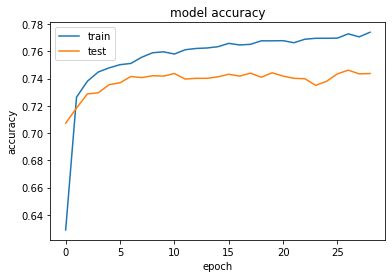

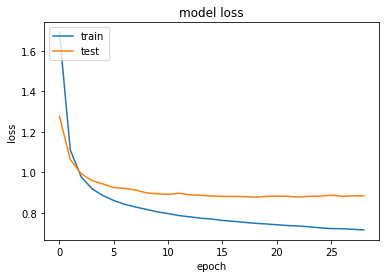

In [ ]:
# summarize history for accuracy
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
max(history.history['val_accuracy'])


0.746122419834137

In [ ]:
# Evaluate the model on the test data using `evaluate`
print("Evaluate on test data")
results = model.evaluate(X_test, y_test, batch_size=128)
print("test loss, test acc:", results)

Evaluate on test data
42/42 [==============================] - 0s 2ms/step - loss: 0.8716 - accuracy: 0.7596
test loss, test acc: [0.8716414570808411, 0.7596190571784973]


In [ ]:
import numpy as np
# predict probabilities for test set
yhat_probs = model.predict(X_test)
# predict crisp classes for test set
yhat_classes = np.argmax(yhat_probs[0])

In [ ]:
yhat_probs

array([[2.8933444e-05, 1.6164316e-06, 3.4272968e-04, ..., 8.3358788e-07,
        3.3959159e-06, 6.0831851e-05],
       [1.4749219e-07, 1.1136608e-07, 2.7945316e-06, ..., 3.3097720e-05,
        1.2077680e-07, 8.1029193e-06],
       [5.5597027e-10, 1.1728326e-12, 3.3115306e-08, ..., 1.4664960e-11,
        9.9087405e-11, 3.6251637e-07],
       ...,
       [3.3623405e-06, 1.6192923e-06, 1.6671768e-04, ..., 4.4604585e-05,
        6.8838382e-01, 3.6464561e-02],
       [1.3221748e-05, 1.5687735e-06, 1.9928756e-04, ..., 9.8928274e-07,
        2.8161628e-06, 6.8840025e-05],
       [2.1034369e-02, 2.9003302e-05, 1.2477633e-04, ..., 4.5198217e-06,
        8.9868608e-06, 2.6360437e-02]], dtype=float32)

In [ ]:
yhat_classes

2265

In [ ]:
yhat_classes = np.argmax(yhat_probs[0])

In [ ]:
type(yhat_probs[0])

numpy.ndarray

In [ ]:
yhat_probs[0]

array([2.89334439e-05, 1.61643163e-06, 3.42729676e-04, 6.43098986e-07,
       6.33130549e-03, 1.18618962e-04, 1.86673515e-02, 6.60905964e-04,
       1.13163749e-03, 1.46596841e-08, 1.44859172e-07, 6.45262105e-07,
       2.59025455e-07, 1.26301500e-04, 3.50969494e-05, 4.73367167e-04,
       4.69522554e-08, 4.56279628e-02, 8.63261148e-03, 1.63781911e-03,
       6.87531079e-04, 7.38186091e-02, 8.28747272e-01, 1.26452055e-02,
       5.87396898e-05, 7.71871811e-09, 1.99331021e-06, 1.49096682e-04,
       1.80177460e-06, 6.57512373e-06, 8.33587876e-07, 3.39591588e-06,
       6.08318514e-05], dtype=float32)

In [ ]:
yhat_classes

22

In [ ]:
y_pred = []
for i in yhat_probs:
  y_pred.append(np.argmax(i))

In [ ]:
y_pred

[22,
 22,
 21,
 22,
 22,
 22,
 22,
 22,
 15,
 22,
 19,
 22,
 17,
 4,
 22,
 5,
 22,
 22,
 22,
 17,
 22,
 22,
 30,
 22,
 22,
 22,
 5,
 22,
 22,
 22,
 22,
 22,
 15,
 22,
 22,
 22,
 22,
 22,
 19,
 22,
 17,
 22,
 22,
 22,
 17,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 17,
 22,
 17,
 22,
 20,
 17,
 21,
 22,
 22,
 21,
 22,
 31,
 17,
 8,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 18,
 17,
 22,
 22,
 22,
 21,
 22,
 20,
 22,
 22,
 22,
 22,
 17,
 22,
 22,
 31,
 21,
 22,
 21,
 22,
 22,
 22,
 21,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 17,
 22,
 22,
 17,
 17,
 19,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 17,
 22,
 22,
 19,
 22,
 17,
 22,
 22,
 22,
 17,
 22,
 31,
 22,
 22,
 22,
 22,
 22,
 22,
 10,
 22,
 21,
 15,
 22,
 3,
 21,
 22,
 22,
 22,
 21,
 3,
 22,
 3,
 22,
 22,
 21,
 22,
 22,
 31,
 19,
 22,
 22,
 22,
 31,
 22,
 22,
 17,
 22,
 22,
 31,
 22,
 15,
 22,
 30,
 22,
 22,
 17,
 22,
 17,
 22,
 22,
 15,
 19,
 21,
 22,
 22,
 3,
 22,
 22,
 7,
 22,
 22,
 28,
 31,
 22,
 22,
 22,

In [ ]:
y_t = []
for i in y_test:
  y_t.append(np.argmax(i))

In [ ]:
y_test

,above,against,around,at,attach to,behind,belong to,beside,by,carry,...,on side of,paint on,park alongside,park on,sit on,stand on,under,walk on,wear,with
45398,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
34558,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4669,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18550,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15844,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35128,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
43200,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
46988,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
45616,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
y_t

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0]

In [ ]:
for i in y_test:
  print(type(i))

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


In [ ]:
len(y_test)

5250

In [ ]:
y_t = []
for i in range(len(y_test)):
  y_t.append(np.argmax(y_test.iloc[i]))

In [ ]:
y_t

[22,
 22,
 21,
 22,
 22,
 21,
 22,
 22,
 15,
 22,
 19,
 22,
 17,
 20,
 22,
 19,
 22,
 22,
 22,
 17,
 18,
 22,
 30,
 22,
 22,
 22,
 19,
 17,
 22,
 22,
 22,
 14,
 15,
 22,
 22,
 22,
 24,
 22,
 7,
 22,
 15,
 22,
 22,
 4,
 32,
 26,
 22,
 22,
 22,
 22,
 22,
 22,
 17,
 22,
 22,
 22,
 26,
 19,
 22,
 32,
 22,
 17,
 22,
 20,
 17,
 21,
 22,
 22,
 21,
 22,
 31,
 15,
 19,
 22,
 22,
 17,
 22,
 22,
 5,
 22,
 22,
 22,
 22,
 8,
 17,
 22,
 22,
 22,
 21,
 22,
 0,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 31,
 21,
 22,
 21,
 22,
 22,
 17,
 21,
 22,
 22,
 22,
 22,
 22,
 22,
 22,
 17,
 22,
 22,
 22,
 17,
 22,
 22,
 10,
 22,
 22,
 19,
 22,
 22,
 17,
 14,
 25,
 19,
 26,
 22,
 22,
 22,
 22,
 22,
 22,
 31,
 22,
 25,
 22,
 22,
 22,
 22,
 10,
 22,
 21,
 32,
 22,
 19,
 21,
 22,
 22,
 22,
 21,
 20,
 22,
 3,
 22,
 24,
 21,
 22,
 22,
 31,
 17,
 22,
 22,
 22,
 15,
 22,
 22,
 17,
 22,
 22,
 15,
 6,
 15,
 22,
 30,
 22,
 22,
 22,
 22,
 27,
 17,
 24,
 15,
 22,
 21,
 22,
 22,
 3,
 22,
 22,
 22,
 22,
 18,
 28,
 17,
 22,
 22,
 22

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

accuracy_score(y_pred, y_t)
precision_score(y_pred, y_t, average = 'macro')
recall_score(y_pred, y_t)
f1_score(y_pred, y_t)

0.28430353078287895

In [ ]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

# Model Accuracy: how often is the classifier correct?
print("Accuracy:",accuracy_score(y_t, y_pred))
print("Precision: ", precision_score(y_t, y_pred, average="macro"))
print("Recall: ",recall_score(y_t, y_pred, average="macro"))
print("F1 score: ",f1_score(y_t, y_pred, average="macro"))


Accuracy: 0.7596190476190476
Precision:  0.352764889556136
Recall:  0.28430353078287895
F1 score:  0.2935419595525528


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
len(X_test)

5250

## Data Imbalance

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [ ]:
cd gdrive/MyDrive/Study/CS839/Graph\ from\ image/Relationship/Results_relationship

/content/gdrive/MyDrive/Study/CS839/Graph from image/Relationship/Results_relationship


In [ ]:
import json
import pandas as pd
import spacy
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner']) # just keep tagger for lemmatization


In [ ]:
# Read X and y data


data = pd.read_csv('X.csv')
#y = pd.read_csv('y.csv')
#y['relationship'] = y['relationship'].str.lower()
data['relationship'] = pd.read_csv('y.csv').relationship

In [ ]:
len(data)

318918

In [ ]:
#data = data[:80000]

In [ ]:
#Replace similar predicates

synonyms = {
    'on': ['be on', 'on top of', 'over', 'on a' ],
    'in': ['in a', 'inside', 'inside of', 'be in'],
    'of': ['of a'],
    'wear': ['wear a'],
    'have': ['have a'],
    'beside': ['next to'],
    'with': ['with a'],
    

}

for key in synonyms:
  for i in synonyms[key]:
    data['relationship'] = data['relationship'].replace(i, key)


In [ ]:
# Check #unique values for 'objects' and 'relationships'

print('Before data cleaning: ')
print('#relationships = ', len(data['relationship'].unique()))

objects = data.subject_name.append(data.object_name)
print('#objects = ', len(objects.unique()))

Before data cleaning: 
#relationships =  8384
#objects =  16015


In [ ]:

# Remove rows which contain rarely occuring features


# object should occur at least 100 times
data = data[data['subject_name'].map(data['subject_name'].value_counts()) > 500]

# object should occur at least 100 times
data = data[data['object_name'].map(data['object_name'].value_counts()) > 500]

# relationship should occur at least 100 times
data = data[data['relationship'].map(data['relationship'].value_counts()) > 500]

# Check #unique values for 'objects' and 'relationships'

print('After data cleaning: ')
print('#relationships = ', len(data['relationship'].unique()))

objects = data.subject_name.append(data.object_name)
print('#objects = ', len(objects.unique()))

After data cleaning: 
#relationships =  18
#objects =  140


In [ ]:
print(data.relationship.value_counts())
print(data.subject_name.value_counts())
print(data.object_name.value_counts())


on             48003
in             12076
have           11692
wear           10127
of              4146
behind          2013
with            1984
near            1974
beside          1807
in front of     1052
on side of      1020
by               868
hold             843
sit on           757
walk on          738
above            674
attach to        561
stand on         503
Name: relationship, dtype: int64
window        14018
man           10761
person         4758
woman          3544
car            3378
              ...  
frame           194
motorcycle      168
cabinet         150
a               136
towel           114
Name: subject_name, Length: 112, dtype: int64
building     15785
shirt         4660
road          3188
wall          3146
tree          3018
             ...  
cloud          442
surfboard      420
airplane       407
bag            377
horse          349
Name: object_name, Length: 77, dtype: int64


In [ ]:
#y = data['relationship']

In [ ]:
# Data Preprocessing
X = pd.DataFrame()
X['rel_x'] = (data['subject_x'] - data['object_x'])/data['Image_Width']
X['rel_y'] = (data['subject_y'] - data['object_y'])/data['Image Height']
X['rel_w'] = data['subject_width']/data['object_width']
X['rel_h'] = data['subject_height']/data['object_height']
X['subject_name'] = data['subject_name']
X['object_name'] = data['object_name']

y = data['relationship']

<BarContainer object of 18 artists>

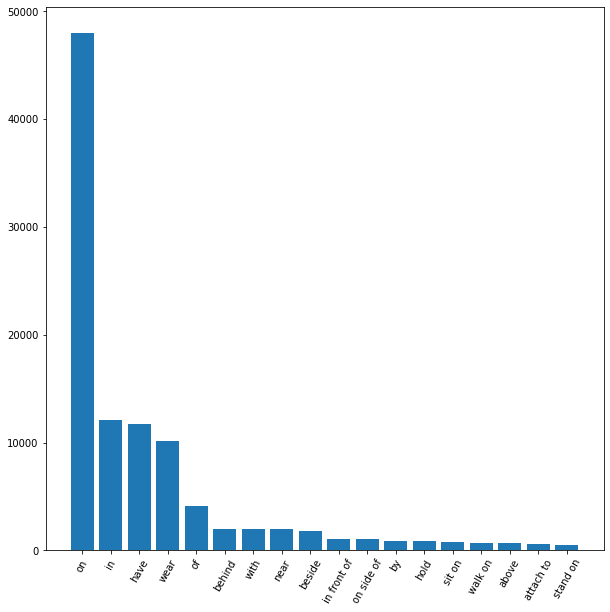

In [ ]:
hist = y.value_counts()
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
plt.xticks(rotation=60)
plt.bar(hist.index, hist)

In [ ]:
# Scaling width and height columns

minimum = X['rel_w'].min()
maximum =  X['rel_w'].max()

X['rel_w'] = (((X['rel_w'] - minimum) / (maximum - minimum)) * 2) - 1

minimum = X['rel_h'].min()
maximum =  X['rel_h'].max()

X['rel_h'] = (((X['rel_h'] - minimum) / (maximum - minimum)) * 2) - 1

In [ ]:
# Oversampling
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
X, y = ros.fit_resample(X, y)

In [ ]:
#Undersampling
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=0)
X, y = rus.fit_resample(X, y)

In [ ]:
y.value_counts()

above          503
attach to      503
wear           503
walk on        503
stand on       503
sit on         503
on side of     503
on             503
of             503
near           503
in front of    503
in             503
hold           503
have           503
by             503
beside         503
behind         503
with           503
Name: relationship, dtype: int64

In [ ]:
len(X), len(y)

(9054, 9054)

In [ ]:
# ONe-hot encoding, but separately on subject and object names
categorical_cols = ['subject_name', 'object_name']
X = pd.get_dummies(X, columns = categorical_cols)

In [ ]:
# Import train_test_split function
from sklearn.model_selection import train_test_split

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=109) # 70% training and 30% test

In [ ]:
#Import svm model
from sklearn import svm

#Create a svm Classifier
clf = svm.SVC(kernel='rbf') # Linear Kernel

#Train the model using the training sets
clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [ ]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

# Model Accuracy: how often is the classifier correct?
print("Accuracy:",accuracy_score(y_test, y_pred))
print("Precision: ", precision_score(y_test, y_pred, average="macro"))
print("Recall: ",recall_score(y_test, y_pred, average="macro"))
print("F1 score: ",f1_score(y_test, y_pred, average="macro"))


Accuracy: 0.5601766654398234
Precision:  0.5443300585191126
Recall:  0.5555080209655646
F1 score:  0.5399872780452806


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


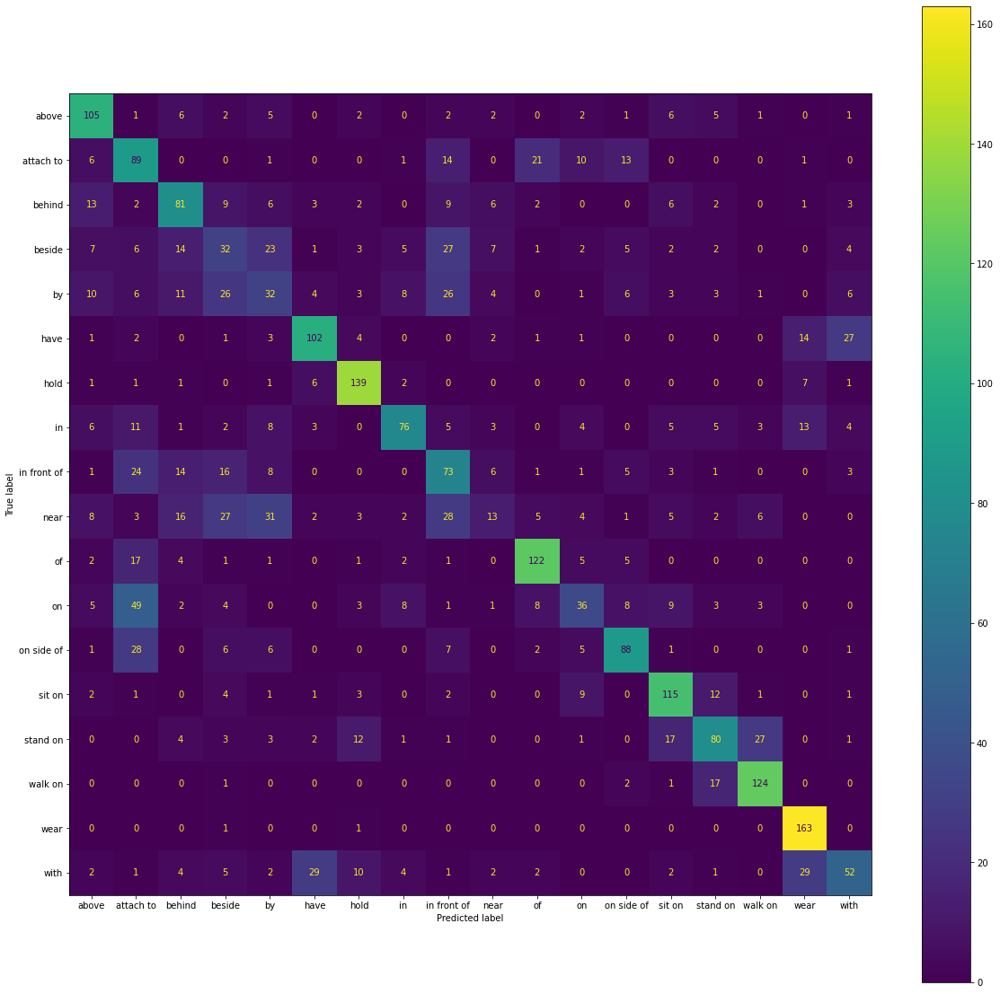

In [ ]:
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
%matplotlib inline
fig, ax = plt.subplots(figsize=(20, 20))
plot_confusion_matrix(clf, X_test, y_test, ax=ax)


In [ ]:
y = pd.get_dummies(y)

In [ ]:
# Import train_test_split function
from sklearn.model_selection import train_test_split

# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=109) # 70% training and 30% test
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.3,random_state=109) # 70% val and 30% train


In [ ]:
len(X_train), len(X_val), len(X_test)

(4435, 1902, 2717)

In [ ]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 12702332686995162136
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 14436532224
locality {
  bus_id: 1
  links {
  }
}
incarnation: 4186465033541669834
physical_device_desc: "device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5"
xla_global_id: 416903419
]


In [ ]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
y

,above,attach to,behind,beside,by,have,hold,in,in front of,near,of,on,on side of,sit on,stand on,walk on,wear,with
0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9049,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
9050,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
9051,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
9052,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [ ]:


from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import np_utils
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from keras.callbacks import EarlyStopping

# define baseline model
def baseline_model():
	# create model
	model = Sequential()
	model.add(Dense(50, input_dim = 193 , activation='relu'))
	model.add(Dense(18, activation='softmax'))
	# Compile model
	model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
	return model

'''
estimator = KerasClassifier(build_fn=baseline_model, epochs=100, batch_size=16, verbose=2)
kfold = KFold(n_splits=5, shuffle=True)
results = cross_val_score(estimator, X, y, cv=kfold)
print("Baseline: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))
'''

# simple early stopping
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
model = baseline_model()
history = model.fit(
    X_train,
    y_train,
    batch_size=16,
    epochs=50,
    # We pass some validation for
    # monitoring validation loss and metrics
    # at the end of each epoch
    validation_data=(X_val, y_val),
    callbacks=[es]
)

Epoch 1/50
278/278 [==============================] - 4s 4ms/step - loss: 2.7047 - accuracy: 0.2322 - val_loss: 2.4200 - val_accuracy: 0.3833
Epoch 2/50
278/278 [==============================] - 1s 3ms/step - loss: 2.0629 - accuracy: 0.4631 - val_loss: 1.8898 - val_accuracy: 0.4558
Epoch 3/50
278/278 [==============================] - 1s 3ms/step - loss: 1.6503 - accuracy: 0.5159 - val_loss: 1.6531 - val_accuracy: 0.4958
Epoch 4/50
278/278 [==============================] - 1s 3ms/step - loss: 1.4703 - accuracy: 0.5430 - val_loss: 1.5559 - val_accuracy: 0.5116
Epoch 5/50
278/278 [==============================] - 1s 3ms/step - loss: 1.3772 - accuracy: 0.5560 - val_loss: 1.5000 - val_accuracy: 0.5184
Epoch 6/50
278/278 [==============================] - 1s 3ms/step - loss: 1.3191 - accuracy: 0.5612 - val_loss: 1.4761 - val_accuracy: 0.5237
Epoch 7/50
278/278 [==============================] - 1s 3ms/step - loss: 1.2787 - accuracy: 0.5741 - val_loss: 1.4570 - val_accuracy: 0.5231
Epoch 

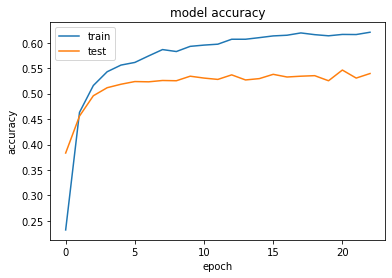

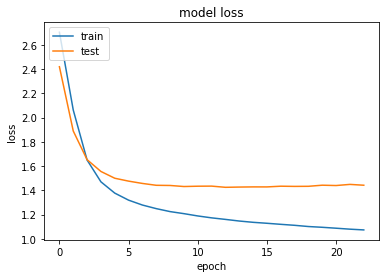

In [ ]:
# summarize history for accuracy
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
# Evaluate the model on the test data using `evaluate`
print("Evaluate on test data")
results = model.evaluate(X_test, y_test, batch_size=128)
print("test loss, test acc:", results)

Evaluate on test data
22/22 [==============================] - 0s 3ms/step - loss: 1.4165 - accuracy: 0.5532
test loss, test acc: [1.4165397882461548, 0.5531836748123169]


In [ ]:
import numpy as np
# predict probabilities for test set
yhat_probs = model.predict(X_test)
# predict crisp classes for test set
yhat_classes = np.argmax(yhat_probs[0])


In [ ]:
yhat_classes = np.argmax(yhat_probs[0])

In [ ]:
y_pred = []
for i in yhat_probs:
  y_pred.append(np.argmax(i))

In [ ]:
y_t = []
for i in range(len(y_test)):
  y_t.append(np.argmax(y_test.iloc[i]))

In [ ]:
y_t

[4,
 13,
 5,
 10,
 0,
 16,
 15,
 13,
 11,
 14,
 16,
 11,
 15,
 13,
 14,
 15,
 17,
 5,
 14,
 16,
 5,
 13,
 11,
 11,
 17,
 7,
 13,
 12,
 2,
 4,
 1,
 13,
 17,
 0,
 3,
 8,
 5,
 16,
 6,
 3,
 15,
 10,
 2,
 15,
 13,
 15,
 2,
 17,
 13,
 4,
 9,
 6,
 8,
 14,
 16,
 10,
 3,
 9,
 4,
 6,
 13,
 13,
 16,
 17,
 2,
 9,
 11,
 12,
 8,
 15,
 15,
 14,
 3,
 7,
 16,
 10,
 16,
 16,
 8,
 17,
 12,
 6,
 14,
 12,
 15,
 7,
 8,
 15,
 2,
 7,
 16,
 17,
 3,
 0,
 4,
 17,
 1,
 15,
 6,
 13,
 3,
 6,
 2,
 4,
 15,
 16,
 8,
 4,
 6,
 11,
 17,
 16,
 17,
 6,
 10,
 1,
 14,
 16,
 3,
 15,
 17,
 3,
 1,
 2,
 14,
 0,
 15,
 7,
 14,
 6,
 4,
 3,
 10,
 6,
 5,
 12,
 11,
 17,
 17,
 7,
 0,
 17,
 15,
 6,
 2,
 2,
 15,
 16,
 10,
 7,
 7,
 3,
 4,
 16,
 17,
 15,
 17,
 15,
 9,
 5,
 5,
 5,
 6,
 12,
 4,
 12,
 17,
 6,
 3,
 17,
 10,
 5,
 12,
 17,
 5,
 14,
 2,
 1,
 17,
 14,
 0,
 11,
 11,
 4,
 0,
 12,
 6,
 10,
 9,
 11,
 15,
 16,
 3,
 0,
 0,
 13,
 12,
 15,
 7,
 13,
 14,
 3,
 12,
 2,
 15,
 11,
 9,
 2,
 7,
 13,
 3,
 17,
 14,
 8,
 14,
 12,
 3,
 8,
 9,
 9,
 1

In [ ]:
y_pred

[3,
 11,
 5,
 10,
 0,
 16,
 15,
 11,
 11,
 14,
 16,
 0,
 14,
 14,
 14,
 15,
 16,
 17,
 15,
 16,
 17,
 13,
 0,
 1,
 16,
 10,
 14,
 1,
 3,
 9,
 10,
 13,
 16,
 0,
 8,
 8,
 17,
 16,
 6,
 9,
 15,
 10,
 2,
 15,
 13,
 15,
 8,
 16,
 14,
 4,
 8,
 6,
 8,
 14,
 16,
 3,
 0,
 3,
 2,
 16,
 13,
 14,
 16,
 5,
 9,
 4,
 11,
 12,
 1,
 15,
 15,
 14,
 6,
 7,
 17,
 10,
 16,
 16,
 8,
 2,
 12,
 6,
 14,
 1,
 15,
 13,
 11,
 15,
 4,
 15,
 16,
 10,
 9,
 0,
 4,
 17,
 10,
 15,
 6,
 13,
 12,
 6,
 2,
 4,
 15,
 16,
 3,
 1,
 6,
 1,
 17,
 16,
 5,
 6,
 10,
 12,
 14,
 16,
 3,
 15,
 5,
 2,
 1,
 3,
 14,
 0,
 14,
 14,
 13,
 6,
 8,
 6,
 1,
 6,
 5,
 11,
 14,
 17,
 5,
 7,
 0,
 14,
 15,
 6,
 2,
 5,
 15,
 16,
 10,
 11,
 7,
 3,
 8,
 16,
 0,
 15,
 17,
 15,
 8,
 5,
 5,
 5,
 6,
 8,
 3,
 12,
 16,
 6,
 7,
 16,
 10,
 5,
 12,
 17,
 16,
 14,
 13,
 1,
 5,
 14,
 1,
 1,
 7,
 12,
 0,
 1,
 6,
 10,
 8,
 13,
 15,
 16,
 0,
 10,
 12,
 11,
 12,
 15,
 0,
 13,
 14,
 3,
 12,
 2,
 15,
 1,
 3,
 0,
 9,
 13,
 13,
 3,
 14,
 3,
 14,
 12,
 3,
 12,
 10,
 7,
 

In [ ]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

# Model Accuracy: how often is the classifier correct?
print("Accuracy:",accuracy_score(y_t, y_pred))
print("Precision: ", precision_score(y_t, y_pred, average="macro"))
print("Recall: ",recall_score(y_t, y_pred, average="macro"))
print("F1 score: ",f1_score(y_t, y_pred, average="macro"))


Accuracy: 0.5531836584468164
Precision:  0.5306457018548523
Recall:  0.5482161937504128
F1 score:  0.5320879124955042
